# Project Title

Uncovering Starbucks' Customer Segments and Predicting Promotional Success

# Problem Statement

Starbucks, a global coffee giant, is struggling to optimize its promotional strategies and improve customer engagement. With a vast customer base and diverse marketing channels, the company is finding it challenging to identify the most effective ways to target its customers and drive sales.

# Project Objective(s)

* Identify distinct customer segments based on their demographic, behavioral, and transactional characteristics
* Develop predictive models to forecast customer responses to different promotional offers, channels, and strategies
* Provide actionable insights to inform data-driven marketing strategies and optimize promotional budgets

# Project Steps

The project will broadly consist of the below steps -  

1. Data Collection
2. Data Cleaning &  Preprocessing
3. Exploratory Data Analysis (EDA)
4. Feature Engineering
5. Customer Segmentation
6. Segment Profiling
7. Predictive Modeling
8. Insights & Actionable Recommendations

# Import Python Libraries

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler, MinMaxScaler, LabelEncoder, OneHotEncoder
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.impute import SimpleImputer
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline

import warnings
warnings.filterwarnings("ignore")

In [2]:
# Show entire rows and columns when called (useful for quickly glancing through all rows and columns)

pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

# 1. Data Collection

Data source - 

https://www.kaggle.com/ihormuliar/starbucks-customer-data

We have 3 files - 
1. profile.csv - 
   Contains dimensional data about each customer like information on their customer id, age, salary and gender. All the records are unique in nature.

Columns (6):
- index
- gender
- age
- id: customer id, 17000 unique values
- became_member_on: date that customer became a member
- income: customer's income

2. portfolio.csv - 
    Contains information about the available promotional offers and basic information about the promotional type, duration, rewards and distribution process to customers

Columns (7):
- index (10)
- reward: value of promotion
- channels: advertising channels
- difficulty: minimum spend to unlock promotion
- duration
- offer_type: type of promotion
- id: offer id

3. transcript.csv - 
   Contains information showing the different steps of promotional offers that a customer received.
   Also includes different transactions that a person made during the time since he/she became a customer. With all records, we can see the day that they interacted with Starbucks and the amount that it is worth.

Columns (5):
- index (307k)
- person: customer id
- event: record description (ie transaction, offer received, offer viewed, etc.)
- value: either an offer id or transaction amount depending on the record
- time: time in hours. The data begins at time t=0

In [3]:
# Load files

profile_df = pd.read_csv(r'C:\Users\Hryshikesh\Desktop\DA Projects\Projects\Starbucks\profile.csv')
portfolio_df = pd.read_csv(r'C:\Users\Hryshikesh\Desktop\DA Projects\Projects\Starbucks\portfolio.csv')
transcript_df = pd.read_csv(r'C:\Users\Hryshikesh\Desktop\DA Projects\Projects\Starbucks\transcript.csv')

In [4]:
profile_df.head(2)

,Unnamed: 0,gender,age,id,became_member_on,income
0,0,NaN,118,68be06ca386d4c31939f3a4f0e3dd783,20170212,NaN
1,1,F,55,0610b486422d4921ae7d2bf64640c50b,20170715,112000.0


In [5]:
portfolio_df.head(2)

,Unnamed: 0,reward,channels,difficulty,duration,offer_type,id
0,0,10,"['email', 'mobile', 'social']",10,7,bogo,ae264e3637204a6fb9bb56bc8210ddfd
1,1,10,"['web', 'email', 'mobile', 'social']",10,5,bogo,4d5c57ea9a6940dd891ad53e9dbe8da0


In [6]:
transcript_df.head(2)

,Unnamed: 0,person,event,value,time
0,0,78afa995795e4d85b5d9ceeca43f5fef,offer received,{'offer id': '9b98b8c7a33c4b65b9aebfe6a799e6d9'},0
1,1,a03223e636434f42ac4c3df47e8bac43,offer received,{'offer id': '0b1e1539f2cc45b7b9fa7c272da2e1d7'},0


# 2. Data Cleaning

In [7]:
# Check for missing values in each dataset

print("Missing values in portfolio.csv:")
print(portfolio_df.isnull().sum())

print("\nMissing values in profile.csv:")
print(profile_df.isnull().sum())

print("\nMissing values in transcript.csv:")
print(transcript_df.isnull().sum())

Missing values in portfolio.csv:
Unnamed: 0    0
reward        0
channels      0
difficulty    0
duration      0
offer_type    0
id            0
dtype: int64

Missing values in profile.csv:
Unnamed: 0             0
gender              2175
age                    0
id                     0
became_member_on       0
income              2175
dtype: int64

Missing values in transcript.csv:
Unnamed: 0    0
person        0
event         0
value         0
time          0
dtype: int64


So only profile.csv has missing values

In [8]:
# Handle missing values (mean/mode imputation)

# 'gender' column
mode_gender = profile_df['gender'].mode()[0]
profile_df['gender'].fillna(mode_gender, inplace=True)

# 'income' column
mean_income = profile_df['income'].mean()
profile_df['income'].fillna(mean_income, inplace=True)

In [9]:
# Verify no more missing values

print("\nMissing values in profile.csv:")
print(profile_df.isnull().sum())


Missing values in profile.csv:
Unnamed: 0          0
gender              0
age                 0
id                  0
became_member_on    0
income              0
dtype: int64


In [10]:
# Remove duplicates

portfolio_df.drop_duplicates(inplace=True)
profile_df.drop_duplicates(inplace=True)
transcript_df.drop_duplicates(inplace=True)

In [11]:
# Handle data types

print("\nData types in portfolio.csv:")
print(portfolio_df.dtypes)

print("\nData types in profile.csv:")
print(profile_df.dtypes)

print("\nData types in transcript.csv:")
print(transcript_df.dtypes)


Data types in portfolio.csv:
Unnamed: 0     int64
reward         int64
channels      object
difficulty     int64
duration       int64
offer_type    object
id            object
dtype: object

Data types in profile.csv:
Unnamed: 0            int64
gender               object
age                   int64
id                   object
became_member_on      int64
income              float64
dtype: object

Data types in transcript.csv:
Unnamed: 0     int64
person        object
event         object
value         object
time           int64
dtype: object


In [12]:
portfolio_df['channels'] = portfolio_df['channels'].astype(str)
profile_df['became_member_on'] = pd.to_datetime(profile_df['became_member_on'], format='%Y%m%d')
profile_df['gender'] = profile_df['gender'].astype('category')
transcript_df['event'] = transcript_df['event'].astype('category')

In [13]:
# Define a function to parse the value column

def parse_value(val):
    try:
        # If the value is a dictionary (string representation), convert it to a dictionary
        val = eval(val)
        # Check if it's an offer-related event
        if 'offer_id' in val:
            return val['offer_id']
        # Check if it's a transaction event
        elif 'amount' in val:
            return val['amount']
    except:
        # If eval fails or val is not a dictionary, return it as it is
        return val

# Apply the parse_value function to the value column
transcript_df['value'] = transcript_df['value'].apply(parse_value)

In [14]:
# Check for outliers in age and income

print("\nSummary statistics for profile.csv:")
print(profile_df.describe())


Summary statistics for profile.csv:
         Unnamed: 0           age               became_member_on  \
count  17000.000000  17000.000000                          17000   
mean    8499.500000     62.531412  2017-02-23 13:12:10.164706048   
min        0.000000     18.000000            2013-07-29 00:00:00   
25%     4249.750000     45.000000            2016-05-26 00:00:00   
50%     8499.500000     58.000000            2017-08-02 00:00:00   
75%    12749.250000     73.000000            2017-12-30 00:00:00   
max    16999.000000    118.000000            2018-07-26 00:00:00   
std     4907.621624     26.738580                            NaN   

              income  
count   17000.000000  
mean    65404.991568  
min     30000.000000  
25%     51000.000000  
50%     65404.991568  
75%     76000.000000  
max    120000.000000  
std     20169.288288  


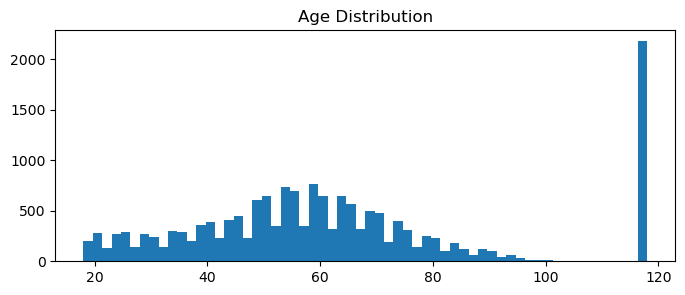

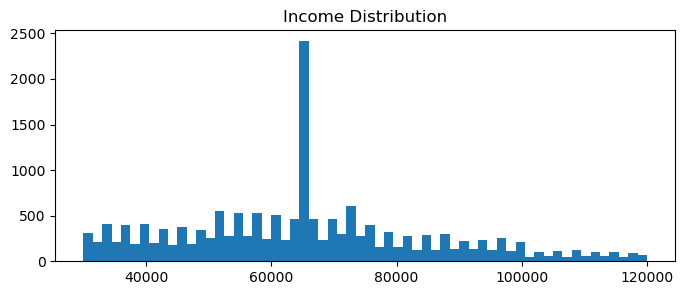

In [15]:
# Visualize the distribution of age and income
plt.figure(figsize=(8, 3))

plt.hist(profile_df['age'], bins=60)
plt.title('Age Distribution')
plt.show()

plt.figure(figsize=(8, 3))
plt.hist(profile_df['income'], bins=60)
plt.title('Income Distribution')
plt.show()

In [16]:
#Identifying Outliers - we can see from the above that there are outliers, confirm the same using IQR

# Calculate Q1 (25th percentile) and Q3 (75th percentile)
Q1_age = profile_df['age'].quantile(0.25)
Q3_age = profile_df['age'].quantile(0.75)
IQR_age = Q3_age - Q1_age

Q1_income = profile_df['income'].quantile(0.25)
Q3_income = profile_df['income'].quantile(0.75)
IQR_income = Q3_income - Q1_income

# Determine outlier bounds
lower_bound_age = Q1_age - 1.5 * IQR_age
upper_bound_age = Q3_age + 1.5 * IQR_age

lower_bound_income = Q1_income - 1.5 * IQR_income
upper_bound_income = Q3_income + 1.5 * IQR_income

# Identify outliers
age_outliers = profile_df[(profile_df['age'] < lower_bound_age) | (profile_df['age'] > upper_bound_age)]
income_outliers = profile_df[(profile_df['income'] < lower_bound_income) | (profile_df['income'] > upper_bound_income)]

print("Age Outliers:")
print(age_outliers)

print("\nIncome Outliers:")
print(income_outliers)


Age Outliers:
       Unnamed: 0 gender  age                                id  \
0               0      M  118  68be06ca386d4c31939f3a4f0e3dd783   
2               2      M  118  38fe809add3b4fcf9315a9694bb96ff5   
4               4      M  118  a03223e636434f42ac4c3df47e8bac43   
6               6      M  118  8ec6ce2a7e7949b1bf142def7d0e0586   
7               7      M  118  68617ca6246f4fbc85e91a2a49552598   
9               9      M  118  8974fc5686fe429db53ddde067b88302   
10             10      M  118  c4863c7985cf408faee930f111475da3   
11             11      M  118  148adfcaa27d485b82f323aaaad036bd   
17             17      M  118  744d603ef08c4f33af5a61c8c7628d1c   
23             23      M  118  2b826eba31074a059d63b0ae8f50b7d5   
26             26      M  118  65aba5c617294649aeb624da249e1ee5   
36             36      M  118  4beeb3ed64dd4898b0edf2f6b67426d3   
39             39      M  118  25c906289d154b66bf579693f89481c9   
44             44      M  118  5b8f1f0e0930464f9

In [17]:
# Handling Outliers

# Cap age outliers at 100
profile_df['age'] = profile_df['age'].apply(lambda x: 100 if x > 100 else x)

# Calculate mean for income
income_mean = profile_df['income'].mean()

# Impute mean for income outliers (considering 1.5*IQR rule)
Q1_income = profile_df['income'].quantile(0.25)
Q3_income = profile_df['income'].quantile(0.75)
IQR_income = Q3_income - Q1_income
upper_bound_income = Q3_income + 1.5 * IQR_income

# Replace income outliers with the mean
profile_df.loc[profile_df['income'] > upper_bound_income, 'income'] = income_mean

# Verify changes
print(profile_df.describe())

         Unnamed: 0           age               became_member_on  \
count  17000.000000  17000.000000                          17000   
mean    8499.500000     60.228176  2017-02-23 13:12:10.164706048   
min        0.000000     18.000000            2013-07-29 00:00:00   
25%     4249.750000     45.000000            2016-05-26 00:00:00   
50%     8499.500000     58.000000            2017-08-02 00:00:00   
75%    12749.250000     73.000000            2017-12-30 00:00:00   
max    16999.000000    100.000000            2018-07-26 00:00:00   
std     4907.621624     22.261686                            NaN   

              income  
count   17000.000000  
mean    64482.163769  
min     30000.000000  
25%     51000.000000  
50%     65404.991568  
75%     75000.000000  
max    113000.000000  
std     18935.955335  


In [18]:
# Save the cleaned datasets

portfolio_df = portfolio_df.rename(columns={'id': 'value_id'})
portfolio_df.to_csv(r'C:\Users\Hryshikesh\Desktop\DA Projects\Projects\Starbucks\portfolio_clean.csv', index=False)

profile_df.to_csv(r'C:\Users\Hryshikesh\Desktop\DA Projects\Projects\Starbucks\profile_clean.csv', index=False)

transcript_df.to_csv(r'C:\Users\Hryshikesh\Desktop\DA Projects\Projects\Starbucks\transcript_clean.csv', index=False)

# 3. Exploratory Data Analysis (EDA)

In [19]:
# Load clean files

portfolio_clean = pd.read_csv(r'C:\Users\Hryshikesh\Desktop\DA Projects\Projects\Starbucks\portfolio_clean.csv')
profile_clean = pd.read_csv(r'C:\Users\Hryshikesh\Desktop\DA Projects\Projects\Starbucks\profile_clean.csv')
transcript_clean = pd.read_csv(r'C:\Users\Hryshikesh\Desktop\DA Projects\Projects\Starbucks\transcript_clean.csv')


In [20]:
# Drop unnecessary columns

portfolio_clean.drop('Unnamed: 0', axis=1, inplace=True)
profile_clean.drop('Unnamed: 0', axis=1, inplace=True)
transcript_clean.drop('Unnamed: 0', axis=1, inplace=True)

In [21]:
portfolio_clean.head(3)

,reward,channels,difficulty,duration,offer_type,value_id
0,10,"['email', 'mobile', 'social']",10,7,bogo,ae264e3637204a6fb9bb56bc8210ddfd
1,10,"['web', 'email', 'mobile', 'social']",10,5,bogo,4d5c57ea9a6940dd891ad53e9dbe8da0
2,0,"['web', 'email', 'mobile']",0,4,informational,3f207df678b143eea3cee63160fa8bed


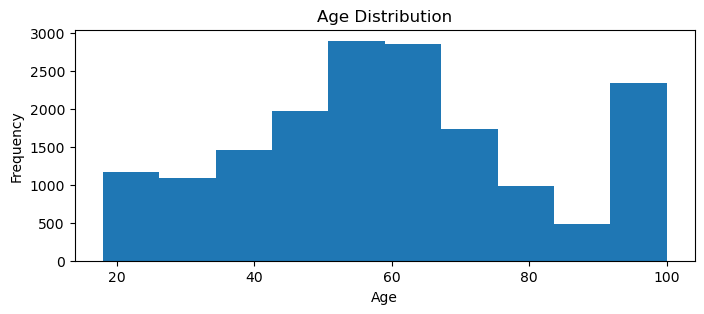

In [22]:
# 1. Age Distribution

plt.figure(figsize=(8, 3))
plt.hist(profile_clean['age'], bins=10)
plt.xlabel('Age')
plt.ylabel('Frequency')
plt.title('Age Distribution')
plt.show()

This histogram shows the distribution of ages in the customer profiles data. We can see that the majority of customers are between 50 and 70 years old.

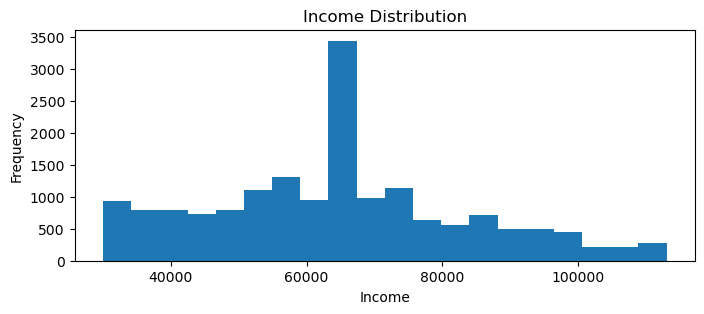

In [23]:
# 2. Income Distribution

plt.figure(figsize=(8,3))
plt.hist(profile_clean['income'], bins=20)
plt.xlabel('Income')
plt.ylabel('Frequency')
plt.title('Income Distribution')
plt.show()

This histogram shows the distribution of incomes in the customer profiles data. We can see that the majority of customers have an income between 50,000 and 70,000 USD

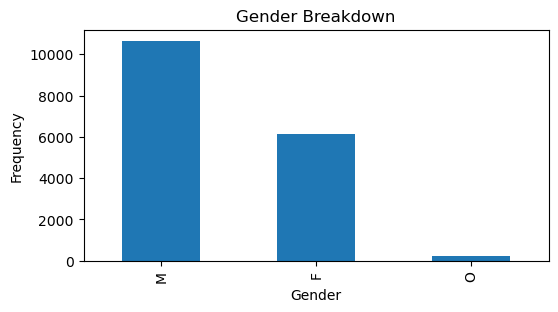

In [24]:
# 3. Gender Breakdown

plt.figure(figsize=(6,3))
profile_clean['gender'].value_counts().plot(kind='bar')
plt.xlabel('Gender')
plt.ylabel('Frequency')
plt.title('Gender Breakdown')
plt.show()

This bar chart shows the breakdown of genders in the customer profiles data. We can see that the majority of customers are male.

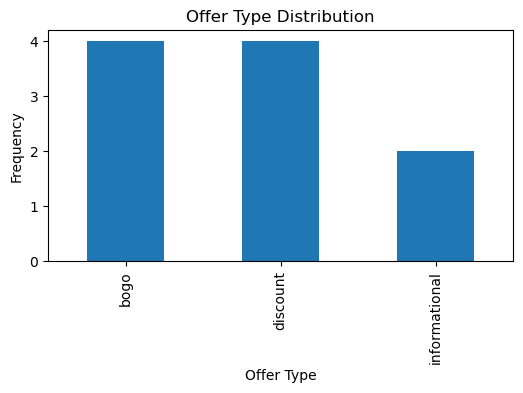

In [25]:
# 4. Portfolio Data - Offer Type Distribution

plt.figure(figsize=(6,3))
portfolio_clean['offer_type'].value_counts().plot(kind='bar')
plt.xlabel('Offer Type')
plt.ylabel('Frequency')
plt.title('Offer Type Distribution')
plt.show()

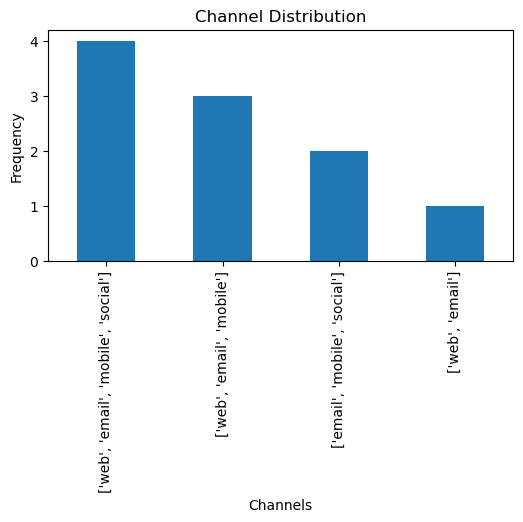

In [26]:
# 5. Channel Distribution

plt.figure(figsize=(6,3))
portfolio_clean['channels'].value_counts().plot(kind='bar')
plt.xlabel('Channels')
plt.ylabel('Frequency')
plt.title('Channel Distribution')
plt.show()

This bar chart shows the distribution of channels in the portfolio data. We can see that the majority of offers are sent through the combined mediums of 'web', 'email', 'mobile', 'social'.

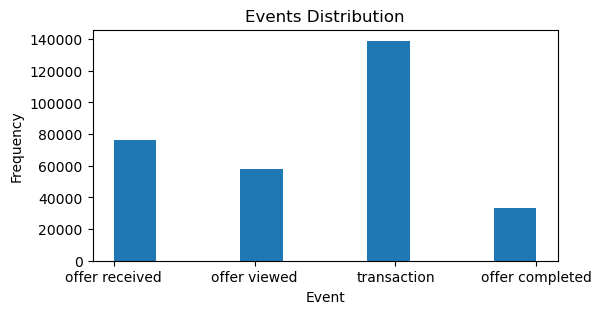

In [27]:
# 6. Event Timestamp Distribution

plt.figure(figsize=(6,3))
plt.hist(transcript_clean['event'])
plt.xlabel('Event')
plt.ylabel('Frequency')
plt.title('Events Distribution')
plt.show()

This histogram shows the distribution of events in the transcript data. We can see that the majority of customers were in the for the transaction stage.

# 4. Feature Engineering

Feature engineering steps to prepare these dataframes for modeling -   

•	Creating age buckets for the age column in profile_clean  
•	Normalizing the income column in profile_clean  
•	Encoding the gender column in profile_clean  
•	Creating interaction features for the channel columns in portfolio_clean  
•	Encoding the event column in transcript_clean  
•	Merging the datasets/dataframes

In [28]:
# Age buckets

age_bins = [20, 30, 40, 50, 60, 70, 100]
age_labels = ['20-30', '30-40', '40-50', '50-60', '60-70', '70+']

profile_clean['age_bucket'] = pd.cut(profile_clean['age'], bins=age_bins, labels=age_labels)

print(profile_clean.head(2))

  gender  age                                id became_member_on  \
0      M  100  68be06ca386d4c31939f3a4f0e3dd783       2017-02-12   
1      F   55  0610b486422d4921ae7d2bf64640c50b       2017-07-15   

          income age_bucket  
0   65404.991568        70+  
1  112000.000000      50-60  


In [29]:
# Income normalization

scaler = StandardScaler()
profile_clean['income_normalized'] = scaler.fit_transform(profile_clean[['income']])

print(profile_clean.head(2))

  gender  age                                id became_member_on  \
0      M  100  68be06ca386d4c31939f3a4f0e3dd783       2017-02-12   
1      F   55  0610b486422d4921ae7d2bf64640c50b       2017-07-15   

          income age_bucket  income_normalized  
0   65404.991568        70+           0.048736  
1  112000.000000      50-60           2.509471  


In [30]:
# Gender encoding

le = LabelEncoder()
profile_clean['gender_encoded'] = le.fit_transform(profile_clean['gender'])

print(profile_clean.head(2))

  gender  age                                id became_member_on  \
0      M  100  68be06ca386d4c31939f3a4f0e3dd783       2017-02-12   
1      F   55  0610b486422d4921ae7d2bf64640c50b       2017-07-15   

          income age_bucket  income_normalized  gender_encoded  
0   65404.991568        70+           0.048736               1  
1  112000.000000      50-60           2.509471               0  


In [31]:
# Channel interaction features

channel_data = {
    'channel': [
        ['email', 'mobile', 'social'],
        ['web', 'email', 'mobile', 'social'],
        ['web', 'email', 'mobile'],
        ['web', 'email']
    ]
}

channel_df = pd.DataFrame(channel_data)

# Create binary indicator features for each channel combination
channel_df['email_mobile_social'] = channel_df['channel'].apply(lambda x: 1 if ('email' in x and 'mobile' in x and 'social' in x) else 0)
channel_df['web_email_mobile_social'] = channel_df['channel'].apply(lambda x: 1 if ('web' in x and 'email' in x and 'mobile' in x and 'social' in x) else 0)
channel_df['web_email_mobile'] = channel_df['channel'].apply(lambda x: 1 if ('web' in x and 'email' in x and 'mobile' in x) else 0)
channel_df['web_email'] = channel_df['channel'].apply(lambda x: 1 if ('web' in x and 'email' in x) else 0)

# Display the resulting DataFrame with binary indicator features
print(channel_df)

                        channel  email_mobile_social  web_email_mobile_social  \
0       [email, mobile, social]                    1                        0   
1  [web, email, mobile, social]                    1                        1   
2          [web, email, mobile]                    0                        0   
3                  [web, email]                    0                        0   

   web_email_mobile  web_email  
0                 0          0  
1                 1          1  
2                 1          1  
3                 0          1  


These binary indicator features can now be used in further analysis, modeling, or segmentation tasks to understand the effectiveness of different channel combinations in the marketing campaigns. 

In [32]:
# Encoding Event Column in Transcript

def transform_clean(transcript_clean):

# Mapping events to numerical values

    event_map = {
    'offer received': 0,
    'offer viewed': 1,
    'transaction': 2,
    'offer completed': 3
}

# Encoding 'event' column
    transcript_clean['event_encoded'] = transcript_clean['event'].map(event_map)

    return transcript_clean

transcript_new = transform_clean(transcript_clean.copy())


# Display the resulting DataFrame with encoded 'event' column

print(transcript_new.head())

                             person           event value  time  event_encoded
0  78afa995795e4d85b5d9ceeca43f5fef  offer received   NaN     0              0
1  a03223e636434f42ac4c3df47e8bac43  offer received   NaN     0              0
2  e2127556f4f64592b11af22de27a7932  offer received   NaN     0              0
3  8ec6ce2a7e7949b1bf142def7d0e0586  offer received   NaN     0              0
4  68617ca6246f4fbc85e91a2a49552598  offer received   NaN     0              0


Aggregation and Merging of Dataframes



In [33]:
# Separate numeric and non-numeric values in 'value' column

transcript_clean['numeric_value'] = pd.to_numeric(transcript_clean['value'], errors='coerce')
transcript_clean['non_numeric_value'] = transcript_clean['value'].where(transcript_clean['numeric_value'].isnull())

In [34]:
# Aggregate data: count events per person
event_counts = transcript_clean.groupby(['person', 'event']).size().unstack(fill_value=0).reset_index()

# Aggregate data: sum transaction amounts per person
transaction_sums = transcript_clean[transcript_clean['event'] == 'transaction'].groupby('person')['numeric_value'].sum().reset_index()

# Merge the event counts and transaction sums into one DataFrame
transcript_aggregated = event_counts.merge(transaction_sums, on='person', how='left')
transcript_aggregated.rename(columns={'numeric_value': 'total_transaction_value'}, inplace=True)

# Merge with the original 'transcript_clean' DataFrame to retain 'value' and 'time' columns
transcript_aggregated = transcript_clean.merge(transcript_aggregated, on='person', how='left')

# Drop the 'event' column as we now have aggregated event counts
transcript_aggregated.drop(columns=['event'], inplace=True)

# Show the resulting DataFrame
print(transcript_aggregated.head(3))

                             person value  time  numeric_value  \
0  78afa995795e4d85b5d9ceeca43f5fef   NaN     0            NaN   
1  a03223e636434f42ac4c3df47e8bac43   NaN     0            NaN   
2  e2127556f4f64592b11af22de27a7932   NaN     0            NaN   

  non_numeric_value  offer completed  offer received  offer viewed  \
0               NaN                3               4             4   
1               NaN                0               5             3   
2               NaN                2               4             3   

   transaction  total_transaction_value  
0            7                   159.27  
1            3                     4.65  
2            3                    57.73  


In [35]:
# Define aggregation functions for each column

aggregation_functions = {
    'time': 'max',  # Assuming I want the last timestamp for each ID
    'numeric_value': 'sum',
    'non_numeric_value': 'first',
    'offer completed': 'sum',
    'offer received': 'sum',
    'offer viewed': 'sum',
    'transaction': 'sum',
    'total_transaction_value': 'sum'
}

# Group by 'person' and apply the aggregation functions
transcript_final = transcript_aggregated.groupby('person').agg(aggregation_functions)

transcript_final = transcript_final.reset_index()

print(transcript_final.head(3))

                             person  time  numeric_value  \
0  0009655768c64bdeb2e877511632db8f   696         127.60   
1  00116118485d4dfda04fdbaba9a87b5c   630           4.09   
2  0011e0d4e6b944f998e987f904e8c1e5   654          79.46   

                  non_numeric_value  offer completed  offer received  \
0  f19421c1d4aa40978ebb69ca19b0e20d               60             100   
1                              None                0              14   
2  2298d6c36e964ae4a3e7e9706d1fb8c2               54              90   

   offer viewed  transaction  total_transaction_value  
0            80          160                  2552.00  
1            14           21                    28.63  
2            90           90                  1430.28  


In [36]:
transcript_final.to_csv(r'C:\Users\Hryshikesh\Desktop\DA Projects\Projects\Starbucks\transcript_aggregated.csv')

In [37]:
# Merge

profile_clean = pd.read_csv(r'C:\Users\Hryshikesh\Desktop\DA Projects\Projects\Starbucks\profile_clean.csv')
portfolio_clean = pd.read_csv(r'C:\Users\Hryshikesh\Desktop\DA Projects\Projects\Starbucks\portfolio_clean.csv')
transcript_aggregated = pd.read_csv(r'C:\Users\Hryshikesh\Desktop\DA Projects\Projects\Starbucks\transcript_aggregated.csv')

In [38]:
# Merge transcript_aggregated with profile_clean

merged_data = pd.merge(profile_clean, transcript_aggregated, left_on='id', right_on='person', how='inner').drop(columns=['person'])

In [39]:
# merged_data with portfolio_clean

final_merged_data = pd.merge(merged_data, portfolio_clean, left_on='non_numeric_value', right_on='value_id', how='left').drop(columns=['Unnamed: 0_y', 'Unnamed: 0_x', 'Unnamed: 0'])
final_merged_data.fillna('NA', inplace=True)

final_merged_data.to_csv(r'C:\Users\Hryshikesh\Desktop\DA Projects\Projects\Starbucks\final_merged_data.csv', index=False)

final_merged_data.head(3)

,gender,age,id,became_member_on,income,time,numeric_value,non_numeric_value,offer completed,offer received,offer viewed,transaction,total_transaction_value,reward,channels,difficulty,duration,offer_type,value_id
0,M,100,68be06ca386d4c31939f3a4f0e3dd783,2017-02-12,65404.991568,696,20.40,fafdcd668e3743c1bb461111dcafc2a4,42,105,105,189,428.40,2.0,"['web', 'email', 'mobile', 'social']",10.0,10.0,discount,fafdcd668e3743c1bb461111dcafc2a4
1,F,55,0610b486422d4921ae7d2bf64640c50b,2017-07-15,112000.000000,528,77.01,9b98b8c7a33c4b65b9aebfe6a799e6d9,6,12,0,18,462.06,5.0,"['web', 'email', 'mobile']",5.0,7.0,bogo,9b98b8c7a33c4b65b9aebfe6a799e6d9
2,M,100,38fe809add3b4fcf9315a9694bb96ff5,2018-07-12,65404.991568,696,14.30,NA,0,20,20,60,143.00,NA,NA,NA,NA,NA,NA


# 5. Customer Segmentation

Using K-Means Clustering for customer segmentation. Here's why:

* Numerical features: K-Means is suitable for datasets with numerical features, which is the case for most of the columns in our dataset (e.g., age, income, transaction frequency, total transaction value).
* Scalability: K-Means is a scalable algorithm that can handle large datasets, which is important since we have a decent-sized dataset.
* Interpretability: K-Means is a relatively simple algorithm, making it easy to interpret the results and understand the characteristics of each segment.
* Handling high-dimensional data: K-Means can handle high-dimensional data, which is the case for our dataset with 20 columns.

In [40]:
final_merged_data = pd.read_csv(r'C:\Users\Hryshikesh\Desktop\DA Projects\Projects\Starbucks\final_merged_data.csv')

In [41]:
# Replace 'NA' strings with np.nan

final_merged_data.replace('NA', np.nan, inplace=True)

In [42]:
# Select relevant features
features = ['age', 'income', 'offer received', 'offer viewed', 'transaction', 'total_transaction_value']
X = final_merged_data[features]

# Separate numerical and categorical features
numerical_features = ['age', 'income', 'total_transaction_value']
categorical_features = ['offer received', 'offer viewed', 'transaction']

# Impute missing values for numerical features
num_imputer = SimpleImputer(strategy='mean')
X[numerical_features] = num_imputer.fit_transform(X[numerical_features])

# Impute missing values for categorical features
cat_imputer = SimpleImputer(strategy='most_frequent')
X[categorical_features] = cat_imputer.fit_transform(X[categorical_features])


In [43]:
# Scale the data using MinMaxScaler

scaler = MinMaxScaler()
X_scaled = scaler.fit_transform(X)

# Convert normalized data back to DataFrame
data_normalized_df = pd.DataFrame(X_scaled, columns=features)

data_normalized_df.head(3)

,age,income,offer received,offer viewed,transaction,total_transaction_value
0,1.00000,0.426566,0.343137,0.364583,0.105882,0.010450
1,0.45122,0.987952,0.039216,0.000000,0.010084,0.011271
2,1.00000,0.426566,0.065359,0.069444,0.033613,0.003488


In [44]:
# Determine the optimal number of clusters (K) using the Elbow Method

K_range = range(2, 10)
silhouette_scores = []

for K in K_range:
    kmeans = KMeans(n_clusters=K, random_state=42, n_init=10, max_iter=300)
    kmeans.fit(X_scaled)
    labels = kmeans.labels_
    
    # Calculate silhouette score on the full data
    silhouette_avg = silhouette_score(X_scaled, labels)
    silhouette_scores.append(silhouette_avg)
    print(f"Silhouette Score for K={K}: {silhouette_avg}")

Silhouette Score for K=2: 0.2819977176185306
Silhouette Score for K=3: 0.2857294300195604
Silhouette Score for K=4: 0.30165007457469534
Silhouette Score for K=5: 0.28588507431600013
Silhouette Score for K=6: 0.2794344596195696
Silhouette Score for K=7: 0.26935883402362376
Silhouette Score for K=8: 0.25989126987325173
Silhouette Score for K=9: 0.2540491614286252


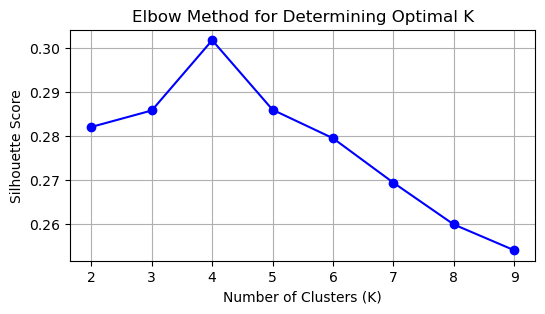

In [45]:
# Plot the silhouette scores to determine the optimal K

plt.figure(figsize=(6, 3))
plt.plot(K_range, silhouette_scores, 'bo-')
plt.xlabel('Number of Clusters (K)')
plt.ylabel('Silhouette Score')
plt.title('Elbow Method for Determining Optimal K')
plt.xticks(K_range)
plt.grid(True)
plt.show()

So, the interpretation is:  
•	Highest Silhouette Score at K = 4 : indicating that a four-cluster solution provides the best separation of the data.  
•	Decreasing Scores for Higher K: The silhouette scores decrease as the number of clusters increases from 4 to 9, suggesting that the clustering quality diminishes with more clusters.  

Based on this interpretation, the optimal number of clusters appears to be K=4

In [46]:
# Apply K-Means clustering with the optimal K

optimal_K = 4
kmeans = KMeans(n_clusters=optimal_K, random_state=42, n_init=10, max_iter=300)
kmeans.fit(X_scaled)

KMeans(n_clusters=4, n_init=10, random_state=42)

In [47]:
# Get the cluster labels for each customer
cluster_labels = kmeans.labels_

# Add the cluster labels to the original dataset
final_merged_data['cluster'] = cluster_labels

final_merged_data.head(3)

,gender,age,id,became_member_on,income,time,numeric_value,non_numeric_value,offer completed,offer received,offer viewed,transaction,total_transaction_value,reward,channels,difficulty,duration,offer_type,value_id,cluster
0,M,100,68be06ca386d4c31939f3a4f0e3dd783,2017-02-12,65404.991568,696,20.40,fafdcd668e3743c1bb461111dcafc2a4,42,105,105,189,428.40,2.0,"['web', 'email', 'mobile', 'social']",10.0,10.0,discount,fafdcd668e3743c1bb461111dcafc2a4,2
1,F,55,0610b486422d4921ae7d2bf64640c50b,2017-07-15,112000.000000,528,77.01,9b98b8c7a33c4b65b9aebfe6a799e6d9,6,12,0,18,462.06,5.0,"['web', 'email', 'mobile']",5.0,7.0,bogo,9b98b8c7a33c4b65b9aebfe6a799e6d9,0
2,M,100,38fe809add3b4fcf9315a9694bb96ff5,2018-07-12,65404.991568,696,14.30,NaN,0,20,20,60,143.00,NaN,NaN,NaN,NaN,NaN,NaN,2


In [48]:
# Strategy Performance Analysis

# Calculate ROI for each offer type

offer_type_roi = final_merged_data.groupby('offer_type')['total_transaction_value'].sum() / final_merged_data.groupby('offer_type')['offer received'].sum()
print("\n",offer_type_roi)


 offer_type
bogo        33.124123
discount    29.701836
dtype: float64


In [49]:
# Calculate conversion rate for each offer type

offer_type_conversion_rate = final_merged_data.groupby('offer_type')['offer completed'].sum() / final_merged_data.groupby('offer_type')['offer received'].sum()
print("\n",offer_type_conversion_rate)


 offer_type
bogo        0.623556
discount    0.594663
dtype: float64


In [50]:
# Calculate ROI for each offer type
offer_type_roi = final_merged_data.groupby('offer_type').apply(
    lambda x: x['total_transaction_value'].sum() / x['offer received'].sum()
).reset_index()

# Rename columns
offer_type_roi.columns = ['Offer Type', 'ROI']

# Print the resulting DataFrame
print("\nOffer Type ROI:")
print(offer_type_roi)


Offer Type ROI:
  Offer Type        ROI
0       bogo  33.124123
1   discount  29.701836


In [51]:
# Channel and Strategy Interaction Analysis (interaction between channels and offer types)

channel_offer_interaction = pd.crosstab(final_merged_data['channels'], final_merged_data['offer_type'])
print(channel_offer_interaction)

offer_type                            bogo  discount
channels                                            
['email', 'mobile', 'social']         1302         0
['web', 'email', 'mobile', 'social']  2816      4441
['web', 'email', 'mobile']            1638      1449
['web', 'email']                         0      1128


# 6. Segment Profiling

In [52]:
# Analyze the characteristics of each segment

for i in range(optimal_K):
    segment_data = final_merged_data[final_merged_data['cluster'] == i]
    print(f"Segment {i+1}:")
    print(segment_data.describe())
    print()

Segment 1:
               age         income         time  numeric_value  \
count  4792.000000    4792.000000  4792.000000    4792.000000   
mean     61.286728   86616.910323   636.558431     150.407692   
std      10.576298   12454.984265    56.395186     149.186488   
min      36.000000   61000.000000   276.000000       0.000000   
25%      53.750000   76000.000000   594.000000      71.007500   
50%      61.000000   86000.000000   648.000000     124.445000   
75%      68.000000   96000.000000   684.000000     188.240000   
max     100.000000  113000.000000   714.000000    1608.690000   

       offer completed  offer received  offer viewed  transaction  \
count      4792.000000     4792.000000   4792.000000  4792.000000   
mean         45.598289       73.076795     56.442821   110.240818   
std          33.745000       32.508977     31.156503    86.415779   
min           0.000000        0.000000      0.000000     0.000000   
25%          18.000000       48.000000     32.000000    45

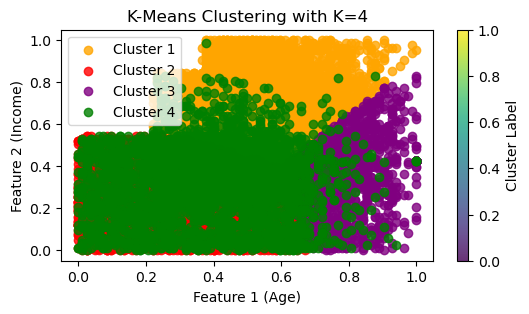

In [53]:
# Visualize the clusters using a scatter plot

plt.figure(figsize=(6, 3))

colors = ['orange', 'red', 'purple','green']

for i in range(optimal_K):
    plt.scatter(X_scaled[cluster_labels == i, 0], X_scaled[cluster_labels == i, 1], 
                label=f'Cluster {i+1}', color=colors[i % len(colors)],alpha=0.8, marker='o')

plt.xlabel('Feature 1 (Age)')
plt.ylabel('Feature 2 (Income)')
plt.title('K-Means Clustering with K=4')
plt.colorbar(label='Cluster Label')
plt.legend()
plt.show()

Segment 1: seems to consist of older, wealthier individuals who engage more with offers and have higher transaction values.  
Segment 2: consists of younger, less wealthy individuals with fewer interactions and lower transaction values.  
Segment 3: includes very old individuals with moderate income and interactions, and moderate transaction values.  
Segment 4: represents middle-aged individuals with moderate income, high interaction levels, and high transaction values.  

In [54]:
# Cluster evaluation - to assess the quality of our segmentation and determine how well-separated and distinct our identified customer segments are. 

#This evaluation is crucial for ensuring that the segments we have identified are meaningful and actionable for further analysis and predictive modeling.

silhouette_avg = silhouette_score(X_scaled, cluster_labels)
print(f"Silhouette Score: {silhouette_avg}")

Silhouette Score: 0.30165007457469534


* Interpretation: A silhouette score close to 0.3 suggests that the clusters are reasonably well-separated and members within each cluster are relatively cohesive compared to other clusters.
* Quality: This score indicates a moderate clustering quality. Higher scores (closer to 1) would imply better-defined clusters with clear boundaries, while scores closer to 0 indicate overlapping clusters or clusters with less distinct boundaries.
* Decision: Based on this score, our clustering solution with K=4 seems reasonable  (but further exploration or comparison with other clustering solutions could be beneficial to validate the stability and consistency of the clusters)

Moving on to predictive modeling to try and forecast how these segments will respond to promotional strategies, enhancing targeted marketing efforts effectively.

# 7. Predictive Modelling

1. Preprocessing Data to make it ready for modelling

In [55]:
final_merged_data = pd.read_csv(r'C:\Users\Hryshikesh\Desktop\DA Projects\Projects\Starbucks\final_merged_data.csv')

print(final_merged_data.columns)

Index(['gender', 'age', 'id', 'became_member_on', 'income', 'time',
       'numeric_value', 'non_numeric_value', 'offer completed',
       'offer received', 'offer viewed', 'transaction',
       'total_transaction_value', 'reward', 'channels', 'difficulty',
       'duration', 'offer_type', 'value_id'],
      dtype='object')


In [56]:
final_merged_data.shape

(17000, 19)

In [57]:
# Check for missing values

print(final_merged_data.isnull().sum())

gender                        0
age                           0
id                            0
became_member_on              0
income                        0
time                          0
numeric_value                 0
non_numeric_value          4226
offer completed               0
offer received                0
offer viewed                  0
transaction                   0
total_transaction_value       0
reward                     4226
channels                   4226
difficulty                 4226
duration                   4226
offer_type                 4226
value_id                   4226
dtype: int64


In [58]:
# Impute missing values with a meaningful value

final_merged_data['non_numeric_value'] = final_merged_data['non_numeric_value'].fillna('NA')
final_merged_data['reward'] = final_merged_data['reward'].fillna(0)
final_merged_data['channels'] = final_merged_data['channels'].fillna('Unknown')
final_merged_data['difficulty'] = final_merged_data['difficulty'].fillna('Medium')
final_merged_data['duration'] = final_merged_data['duration'].fillna(0)
final_merged_data['value_id'] = final_merged_data['value_id'].fillna('Unknown')
final_merged_data['offer_type'] = final_merged_data['offer_type'].fillna('NA')
print(final_merged_data.isnull().sum())

gender                     0
age                        0
id                         0
became_member_on           0
income                     0
time                       0
numeric_value              0
non_numeric_value          0
offer completed            0
offer received             0
offer viewed               0
transaction                0
total_transaction_value    0
reward                     0
channels                   0
difficulty                 0
duration                   0
offer_type                 0
value_id                   0
dtype: int64


In [59]:
# Encoding Categorical Variables - gender, offer_type & channels

# One-hot encode categorical variables
final_merged_data = pd.get_dummies(final_merged_data, columns=['gender', 'id', 'channels', 'difficulty', 'offer_type', 'value_id', 'non_numeric_value'], dtype=int)

final_merged_data.head(3)

,age,became_member_on,income,time,numeric_value,offer completed,offer received,offer viewed,transaction,total_transaction_value,reward,duration,gender_F,gender_M,gender_O,id_0009655768c64bdeb2e877511632db8f,id_00116118485d4dfda04fdbaba9a87b5c,id_0011e0d4e6b944f998e987f904e8c1e5,id_0020c2b971eb4e9188eac86d93036a77,id_0020ccbbb6d84e358d3414a3ff76cffd,id_003d66b6608740288d6cc97a6903f4f0,id_00426fe3ffde4c6b9cb9ad6d077a13ea,id_004b041fbfe44859945daa2c7f79ee64,id_004c5799adbf42868b9cff0396190900,id_005500a7188546ff8a767329a2f7c76a,id_0056df74b63b4298809f0b375a304cf4,id_0063def0f9c14bc4805322a488839b32,id_0069a50874d846438e58acff5e594725,id_00715b6e55c3431cb56ff7307eb19675,id_0082fd87c18f45f2be70dbcbb0fb8aad,id_00840a2ca5d2408e982d56544dc14ffd,id_00857b24b13f4fe0ad17b605f00357f5,id_008d7088107b468893889da0ede0df5c,id_0091d2b6a5ea4defaa8393e4e816db60,id_0092a132ead946ceb30d11a1ed513d20,id_0099bf30e4cb4265875266eb3eb25eab,id_009d10c2c38a4fd795a7bc6ddbbddb78,id_00a794f62b9a48beb58f8f6c02c2f1a6,id_00ad4c2cace94f67a6354ec90d6c6f45,id_00ae03011f9f49b8a4b3e6d416678b0b,id_00aee28bbb3848dd8a31f0c91dc267dd,id_00b18b535d6d4f779dea4dc9ac451478,id_00b3400e4ff64ee68ce9ada1d0c222f0,id_00b3c376db2a4115af3aef34a02f61d6,id_00b5fb9d842d437e83033ad9e36f7148,id_00b901d68f8f4fd68075184cd0f772d2,id_00bbce6533f44ddeaf4dd32bcab55441,id_00bc42a62f884b41a13cc595856cf7c3,id_00bc983061d3471e8c8e74d31b7c8b6f,id_00c20a9202d5475190b31a24de6fb06d,id_00c2f812f4604c8893152a5c6572030e,id_00c32a104f0c4065b5b552895fb22e34,id_00c5a385c71a4d3db5e9b4e31e430943,id_00c6035df45840038a72766c6d27a0db,id_00c91f31f5f74e769fa7a359b63e1a9f,id_00ceaf16a40341e6996d543d04daa2c2,id_00cf1bbec83f4a658f8994e556db4633,id_00cf471ed1aa42a8bdde5561d67da2b1,id_00d6dc87be4146ceb47fcd4baaaf6477,id_00d791e20c564add8056498e40eb56cc,id_00d7c95f793a4212af44e632fdc1e431,id_00d91c5919514448bc4f718e4e3f26ab,id_00e20b4ca129458aaab0f4727ef3513a,id_00e52682848542c3a6f59b7824e9a5c5,id_00e8d701c583461e81cc10053681a12b,id_00e9f403afa641889cd034ee7c7ca6e9,id_00ed7e22b32749cfafbfd88592d401d4,id_00ee2ca6421c4af0aeca60a1b3e00f6c,id_00ee69db83964d6da32f8109b32a1ce7,id_00fac72fd6ad448e8019b175267023df,id_00fbb9b5edb94f02afbaf1eb49bb4d7d,id_00fdd4416dec40b49180814c0a7c8d76,id_0100dbd4e8554aa69b73b6ac0547f6bf,id_0103de989e084e0fab400e80678d7591,id_0106d19a26af41288035afc4b9b6c2c2,id_01162252405b4524a8fa1bf8e6d5f04b,id_01176ee7289b48e39ee6261d5c071a07,id_0118fbb66dd2443a9dd407d2c99a7672,id_0121fe001b7a404fa9cbe486f8944baf,id_0123564dbaf144a88a418c33b6350c17,id_012ee55a90bd4d969b0d0cdfaffdf6ab,id_013094309e1b49e095c098df412d125d,id_01380da907f8495496679c795867790b,id_013f2c82889f4641a9b847a48861cce0,id_0141d3870a424c03a20390040efad826,id_01443a2afce54939a323c978f467c540,id_014899c751254a62a96ce676eb11ddc2,id_0155a21497d54684a55c3bc609843768,id_0157e63b39c5456393026c6c03f3d84a,id_015c3d28c67e46aa95e9ec97c27220e8,id_015ef929e016415098eeae8ce59da721,id_015fb0b3fbaa4aceb910fbdf272f7547,id_016086228d58476599d0b47881c25509,id_01613170f679422a8acfa96f0f19fdf2,id_01633b71b3a2457aa7d35d8bcc3afb5a,id_016871ea865d4338975026ae08d221d0,id_016b37032984457fb33ba2767fcc8c9f,id_016edb1d1d67477391c5337545a5d98a,id_017160c1cdb845d48abec3c330b4427e,id_01772eae932447f9a853461a60820dc6,id_01784d3e205548a594ba3fcdbdaaf17d,id_017a93d1204f457bbe85f5e7de062b56,id_017febbe52e64ac19cf28cf0d44386e4,id_01873cc8de734961949af7c04b2e9872,id_01887dcd32b64feb807e2436548b6c87,id_018a49ffb8cf4812903e7c1f56fbb0b0,id_018b8f83176d471db63d9733c741fc8a,id_01925607d99c460996c281f17cdbb9e2,id_0193c118afe84208b33ffeb1dcb277d8,id_01956670cf414b309675aa73368b94a9,id_0196d2062b8d4d019b8d96292266e8a4,id_0199681637524988a14245632b8376af,id_019be0c6f8fd4000b1967c7308b4bdf4,id_019cc78d8fed432ca6df71c132c72a99,id_019ed95d987446e3947da0246cdab831,id_01a202a9021e40aeaa5451a5d134c16c,id_01a5e8b57bc04e0292525f3e2817fa17,id_01ab25c31f034f85bc4ac9d286fb7a76,id_01ac633821f0498893320b41b5b22dfc,id_01b6d7e8f0884deb936a8a7f15dba895,id_01d26f638c274aa0b965d24cefe3183f,id_01d7da27b8

In [60]:
# normalizing the numerical variables using StandardScaler

numerical_cols = final_merged_data.select_dtypes(include=['int64', 'float64']).columns

# Create a StandardScaler object
scaler = StandardScaler()

# Fit the scaler to the numerical data and transform it
final_merged_data[numerical_cols] = scaler.fit_transform(final_merged_data[numerical_cols])

# Cyclic Encoding for the date (became_member_on) column
final_merged_data['became_member_on'] = pd.to_datetime(final_merged_data['became_member_on'])
final_merged_data['date_sin'] = np.sin(2 * np.pi * final_merged_data['became_member_on'].dt.dayofyear / 365)
final_merged_data['date_cos'] = np.cos(2 * np.pi * final_merged_data['became_member_on'].dt.dayofyear / 365)

del final_merged_data['became_member_on']

In [61]:
final_merged_data.head(3)

,age,income,time,numeric_value,offer completed,offer received,offer viewed,transaction,total_transaction_value,reward,duration,gender_F,gender_M,gender_O,id_0009655768c64bdeb2e877511632db8f,id_00116118485d4dfda04fdbaba9a87b5c,id_0011e0d4e6b944f998e987f904e8c1e5,id_0020c2b971eb4e9188eac86d93036a77,id_0020ccbbb6d84e358d3414a3ff76cffd,id_003d66b6608740288d6cc97a6903f4f0,id_00426fe3ffde4c6b9cb9ad6d077a13ea,id_004b041fbfe44859945daa2c7f79ee64,id_004c5799adbf42868b9cff0396190900,id_005500a7188546ff8a767329a2f7c76a,id_0056df74b63b4298809f0b375a304cf4,id_0063def0f9c14bc4805322a488839b32,id_0069a50874d846438e58acff5e594725,id_00715b6e55c3431cb56ff7307eb19675,id_0082fd87c18f45f2be70dbcbb0fb8aad,id_00840a2ca5d2408e982d56544dc14ffd,id_00857b24b13f4fe0ad17b605f00357f5,id_008d7088107b468893889da0ede0df5c,id_0091d2b6a5ea4defaa8393e4e816db60,id_0092a132ead946ceb30d11a1ed513d20,id_0099bf30e4cb4265875266eb3eb25eab,id_009d10c2c38a4fd795a7bc6ddbbddb78,id_00a794f62b9a48beb58f8f6c02c2f1a6,id_00ad4c2cace94f67a6354ec90d6c6f45,id_00ae03011f9f49b8a4b3e6d416678b0b,id_00aee28bbb3848dd8a31f0c91dc267dd,id_00b18b535d6d4f779dea4dc9ac451478,id_00b3400e4ff64ee68ce9ada1d0c222f0,id_00b3c376db2a4115af3aef34a02f61d6,id_00b5fb9d842d437e83033ad9e36f7148,id_00b901d68f8f4fd68075184cd0f772d2,id_00bbce6533f44ddeaf4dd32bcab55441,id_00bc42a62f884b41a13cc595856cf7c3,id_00bc983061d3471e8c8e74d31b7c8b6f,id_00c20a9202d5475190b31a24de6fb06d,id_00c2f812f4604c8893152a5c6572030e,id_00c32a104f0c4065b5b552895fb22e34,id_00c5a385c71a4d3db5e9b4e31e430943,id_00c6035df45840038a72766c6d27a0db,id_00c91f31f5f74e769fa7a359b63e1a9f,id_00ceaf16a40341e6996d543d04daa2c2,id_00cf1bbec83f4a658f8994e556db4633,id_00cf471ed1aa42a8bdde5561d67da2b1,id_00d6dc87be4146ceb47fcd4baaaf6477,id_00d791e20c564add8056498e40eb56cc,id_00d7c95f793a4212af44e632fdc1e431,id_00d91c5919514448bc4f718e4e3f26ab,id_00e20b4ca129458aaab0f4727ef3513a,id_00e52682848542c3a6f59b7824e9a5c5,id_00e8d701c583461e81cc10053681a12b,id_00e9f403afa641889cd034ee7c7ca6e9,id_00ed7e22b32749cfafbfd88592d401d4,id_00ee2ca6421c4af0aeca60a1b3e00f6c,id_00ee69db83964d6da32f8109b32a1ce7,id_00fac72fd6ad448e8019b175267023df,id_00fbb9b5edb94f02afbaf1eb49bb4d7d,id_00fdd4416dec40b49180814c0a7c8d76,id_0100dbd4e8554aa69b73b6ac0547f6bf,id_0103de989e084e0fab400e80678d7591,id_0106d19a26af41288035afc4b9b6c2c2,id_01162252405b4524a8fa1bf8e6d5f04b,id_01176ee7289b48e39ee6261d5c071a07,id_0118fbb66dd2443a9dd407d2c99a7672,id_0121fe001b7a404fa9cbe486f8944baf,id_0123564dbaf144a88a418c33b6350c17,id_012ee55a90bd4d969b0d0cdfaffdf6ab,id_013094309e1b49e095c098df412d125d,id_01380da907f8495496679c795867790b,id_013f2c82889f4641a9b847a48861cce0,id_0141d3870a424c03a20390040efad826,id_01443a2afce54939a323c978f467c540,id_014899c751254a62a96ce676eb11ddc2,id_0155a21497d54684a55c3bc609843768,id_0157e63b39c5456393026c6c03f3d84a,id_015c3d28c67e46aa95e9ec97c27220e8,id_015ef929e016415098eeae8ce59da721,id_015fb0b3fbaa4aceb910fbdf272f7547,id_016086228d58476599d0b47881c25509,id_01613170f679422a8acfa96f0f19fdf2,id_01633b71b3a2457aa7d35d8bcc3afb5a,id_016871ea865d4338975026ae08d221d0,id_016b37032984457fb33ba2767fcc8c9f,id_016edb1d1d67477391c5337545a5d98a,id_017160c1cdb845d48abec3c330b4427e,id_01772eae932447f9a853461a60820dc6,id_01784d3e205548a594ba3fcdbdaaf17d,id_017a93d1204f457bbe85f5e7de062b56,id_017febbe52e64ac19cf28cf0d44386e4,id_01873cc8de734961949af7c04b2e9872,id_01887dcd32b64feb807e2436548b6c87,id_018a49ffb8cf4812903e7c1f56fbb0b0,id_018b8f83176d471db63d9733c741fc8a,id_01925607d99c460996c281f17cdbb9e2,id_0193c118afe84208b33ffeb1dcb277d8,id_01956670cf414b309675aa73368b94a9,id_0196d2062b8d4d019b8d96292266e8a4,id_0199681637524988a14245632b8376af,id_019be0c6f8fd4000b1967c7308b4bdf4,id_019cc78d8fed432ca6df71c132c72a99,id_019ed95d987446e3947da0246cdab831,id_01a202a9021e40aeaa5451a5d134c16c,id_01a5e8b57bc04e0292525f3e2817fa17,id_01ab25c31f034f85bc4ac9d286fb7a76,id_01ac633821f0498893320b41b5b22dfc,id_01b6d7e8f0884deb936a8a7f15dba895,id_01d26f638c274aa0b965d24cefe3183f,id_01d7da27b8934ba1b3602a0153e

In [62]:
final_merged_data.shape

(17000, 17047)

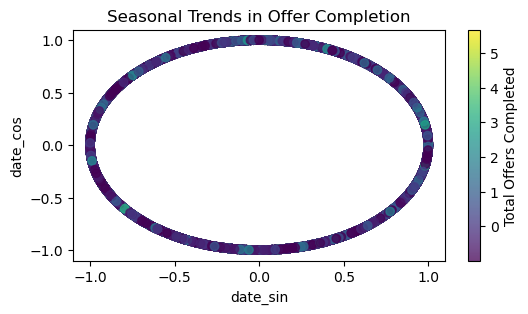

In [63]:
# Plot the Cyclical Trends - 1.Plot 'offer completed'

plt.figure(figsize=(6, 3))
plt.scatter(final_merged_data['date_sin'], final_merged_data['date_cos'], c=final_merged_data['offer completed'], cmap='viridis', alpha=0.75)
plt.colorbar(label='Total Offers Completed')
plt.title('Seasonal Trends in Offer Completion')
plt.xlabel('date_sin')
plt.ylabel('date_cos')
plt.show()

There are specific points on the cycle where the number of offers completed is higher (lighter spots), indicating potential seasonal peaks in offer engagement.

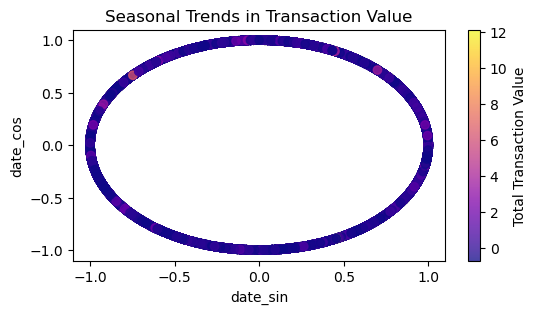

In [64]:
# 2. 'total_transaction_value'

plt.figure(figsize=(6, 3))
plt.scatter(final_merged_data['date_sin'], final_merged_data['date_cos'], c=final_merged_data['total_transaction_value'], cmap='plasma', alpha=0.75)
plt.colorbar(label='Total Transaction Value')
plt.title('Seasonal Trends in Transaction Value')
plt.xlabel('date_sin')
plt.ylabel('date_cos')
plt.show()

The transaction values show cyclical variation, with higher transaction values occurring at specific points in the cycle (lighter spots)  
This indicates that certain times of the year are associated with higher transaction values, which align with seasonal patterns.

2. Feature Selection

Using mutual information feature selection to select the top 10 features with the highest correlation with the target variable.

In [65]:
from sklearn.metrics import mutual_info_score

target = final_merged_data['offer completed']

# Calculate mutual information between each feature and the target variable
mutual_info = []
for col in final_merged_data.columns:
    if col != 'offer completed':  # exclude the target variable itself
        mi = mutual_info_score(final_merged_data[col], target)
        mutual_info.append((col, mi))

# Sort the results by mutual information in descending order
mutual_info.sort(key=lambda x: x[1], reverse=True)

# Print the top features by mutual information
print("Top features by mutual information:")
for col, mi in mutual_info[:10]:  # show top 10 features
    print(f"{col}: {mi:.4f}")

Top features by mutual information:
total_transaction_value: 3.8016
numeric_value: 3.5354
transaction: 2.5157
offer received: 2.2969
offer viewed: 2.2335
date_sin: 0.8625
date_cos: 0.8130
reward: 0.5833
duration: 0.5715
channels_Unknown: 0.5608


3. Split our data into training and testing sets.

In [66]:
from sklearn.model_selection import train_test_split

# Select the top 10 features with the highest mutual information
top_features = [col for col, mi in mutual_info[:10]]

X = final_merged_data[top_features]  # features
y = final_merged_data['offer completed']  # target variable

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

4. Training the model

In [67]:
import xgboost as xgb

# Train a GBM model
xgb_model = xgb.XGBRegressor(objective='reg:squarederror', max_depth=6, learning_rate=0.1, n_estimators=1000)
xgb_model.fit(X_train, y_train)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.1, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=6, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=1000, n_jobs=None,
             num_parallel_tree=None, random_state=None, ...)

5. Evaluate the model using regression metrics

In [68]:
from sklearn.metrics import mean_squared_error, mean_absolute_error

y_pred = xgb_model.predict(X_test)

mse = mean_squared_error(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
print(f"Mean Squared Error: {mse:.2f}")
print(f"Mean Absolute Error: {mae:.2f}")

Mean Squared Error: 0.07
Mean Absolute Error: 0.15


While these metrics indicate that our model is performing reasonably well, there is still room for improvement.  
* The MSE of 0.07 suggests that our model is, on average, off by about 0.07 units from the actual values, and
* The MAE of 0.15 indicates that the average absolute difference between predicted and actual values is 0.15 units.

To further improve the model's performance and reduce these errors, we will move on to the next step of hyperparameter tuning. By optimizing the hyperparameters of our Gradient Boosting Regressor, we hope to achieve even better results and improve the model's ability to accurately predict the target variable.

In [69]:
from sklearn.ensemble import GradientBoostingRegressor

# Select the top 10 features by mutual information
top_features = [col for col, mi in mutual_info[:10]]

# Create a new dataset with the selected features
X = final_merged_data[top_features]
y = final_merged_data['offer completed']

# Train the Gradient Boosting Regressor
gbm = GradientBoostingRegressor()
gbm.fit(X, y)

GradientBoostingRegressor()

In [70]:
# evaluate GradientBoostingRegressor

from sklearn.metrics import mean_squared_error, mean_absolute_error

# Make predictions on the training set
y_pred = gbm.predict(X)

# Evaluate the performance using MSE and MAE
mse = mean_squared_error(y, y_pred)
mae = mean_absolute_error(y, y_pred)

print(f"Mean Squared Error (MSE): {mse:.4f}")
print(f"Mean Absolute Error (MAE): {mae:.4f}")

Mean Squared Error (MSE): 0.1239
Mean Absolute Error (MAE): 0.2325


As we can see, the results of GradientBoostingRegressor did not outperform that of xgboost. So for now we will move ahead with XGBoost Regressor 

Here's a summary of our model:

* Model: XGBoost Regressor  
* Hyperparameters:
* objective: reg:squarederror
* max_depth: 6
* learning_rate: 0.1
* n_estimators: 1000
  
We can deploy this model (into a larger system or application) to make predictions on new data, and also to evaluate its performance on the testing set.

NOTE: We will not be doing this (model deployment) as this as part of this porftfolio project and move ahead with Feature Importance Analysis.

6. Feature Importance Analysis:

In [71]:
importance = xgb_model.feature_importances_
importance_df = pd.DataFrame(list(zip(final_merged_data.columns, importance)), 
                              columns=['Feature', 'Importance'])
importance_df = importance_df.sort_values(by='Importance', ascending=False)

print("\n",importance_df)


                    Feature  Importance
0                      age    0.431883
7              transaction    0.256308
3            numeric_value    0.214326
2                     time    0.026256
4          offer completed    0.022941
1                   income    0.015627
5           offer received    0.012070
6             offer viewed    0.010962
8  total_transaction_value    0.009627
9                   reward    0.000000


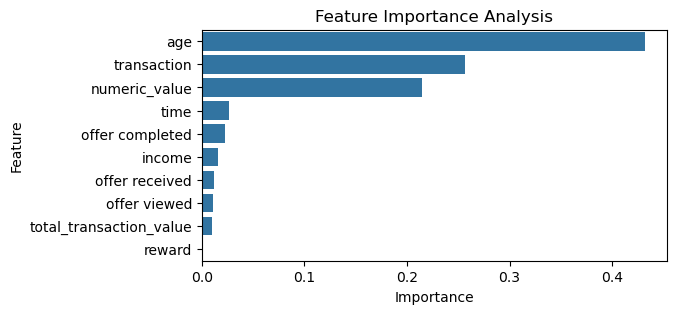

In [72]:
# Bar chart to visualize feature importance

import seaborn as sns

plt.figure(figsize=(6, 3))
sns.barplot(x='Importance', y='Feature', data=importance_df)
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.title('Feature Importance Analysis')
plt.show()

So as per this, the 'age' feature is the most important, contributing about 43% to the model's predictions while the 'reward' feature has an importance score of 0, which suggests that it may not be a useful feature for predicting the target variable.

# 8. Insights & Actionable Recommendations

1. Target High-Value Segments with Personalized Offers:

Focus marketing efforts on Segment 1 (older, wealthier customers) and Segment 4 (middle-aged, high-interaction customers) by offering personalized high-value promotions and rewards to maximize engagement and transaction values. .


2. Address Demographic-Specific Strategies:
   
For Segment 2 (younger, less wealthy individuals), develop budget-friendly offers and campaigns focused on building long-term loyalty. For Segment 3 (older individuals with moderate income), provide moderate-value offers with a focus on ease of use and convenience.

3. Enhance Offer Types Based on Customer Preferences:

Tailor marketing campaigns to appeal to the majority demographic: males between 50 and 70 years old with moderate to high income.  
Increase the use of BOGO and discount offers, as they have the highest ROI and conversion rates. Informational offers can be used to supplement these to maintain customer interest.

4. Optimize Channels for Promotional Strategies:

Prioritize multi-channel strategies, especially combinations involving web, email, mobile, and social media, to maximize reach and effectiveness. Segment 4 shows the highest interaction levels across these channels.

5. Leverage Seasonal Promotions:
   
Focus marketing efforts and promotions during the periods when both offer completions and transaction values are higher. This strategy aligns with customer behavior, increasing engagement and transaction value.

6. Leverage Top Predictive Features for Marketing Campaigns:

Utilize key variables such as total transaction value, numeric value, transaction history while giving special focus & importance on the age factor to tailor and predict customer responses to promotions. This will help in crafting more effective marketing strategies.

These actionable recommendations provide a roadmap for Starbucks to improve customer engagement, optimize promotional budgets, and drive sales growth by leveraging data-driven insights and targeted marketing strategies.

# Thank You,
# Hryshikesh Dihingia